# Importing Dataset

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mdrifaturrahman33/levir-cd")

print("Path to dataset files:", path)


100%|██████████| 2.30G/2.30G [01:03<00:00, 38.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mdrifaturrahman33/levir-cd/versions/1


## Copy to Main directory

In [ ]:
import shutil
import os

os.makedirs('/content/levir-cd', exist_ok=True)

shutil.copytree(path, '/content/levir-cd/LEVIR_CD')


'/content/levir-cd/LEVIR_CD'

# Loading function:

This class defines a custom PyTorch `Dataset` for loading image pairs and labels from the **LEVIR-CD** dataset, which is commonly used for change detection tasks in remote sensing. The dataset structure is expected to have three subdirectories within the root directory:
- `A/`: containing the first set of images (e.g., time T1),
- `B/`: containing the second set of images (e.g., time T2),
- `label/`: containing the corresponding change maps (labels).

The dataset:
- Sorts the file names to ensure correct alignment between image pairs and labels.
- Supports optional image transformations using `torchvision.transforms`.
- Provides data in the form of a tuple `(image_A, image_B, label)` through the `__getitem__` method.

This dataset can be used with PyTorch data loaders for training deep learning models for change detection.

In [ ]:
import os
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as transforms

class LEVIRDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.a_images = sorted(os.listdir(os.path.join(root_dir, 'A')))
        self.b_images = sorted(os.listdir(os.path.join(root_dir, 'B')))
        self.labels = sorted(os.listdir(os.path.join(root_dir, 'label')))

    def __len__(self):
        return len(self.a_images)

    def __getitem__(self, idx):
        a_path = os.path.join(self.root_dir, 'A', self.a_images[idx])
        b_path = os.path.join(self.root_dir, 'B', self.b_images[idx])
        label_path = os.path.join(self.root_dir, 'label', self.labels[idx])

        a_image = Image.open(a_path).convert('RGB')
        b_image = Image.open(b_path).convert('RGB')
        label = Image.open(label_path).convert('L')  # Label is grayscale

        if self.transform:
            a_image = self.transform(a_image)
            b_image = self.transform(b_image)
            label = self.transform(label)

        combined = torch.cat([a_image, b_image], dim=0)


        return combined, label


## Transfomer Initialization

In [ ]:
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])


## Visualising dataset

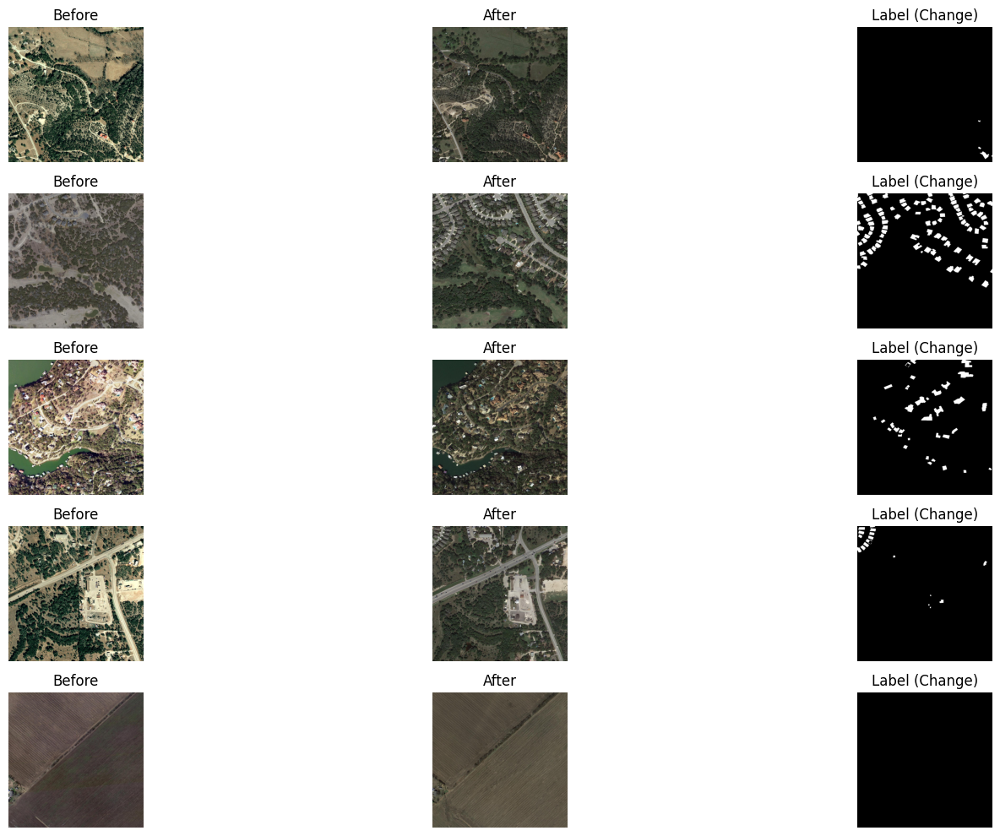

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Path to your dataset
dataset_path = '/content/levir-cd/LEVIR_CD/LEVIR CD'

# Example folders
before_folder = os.path.join(dataset_path, 'train', 'A')
after_folder = os.path.join(dataset_path, 'train', 'B')
label_folder = os.path.join(dataset_path, 'train', 'label')

# List of image filenames
image_filenames = os.listdir(before_folder)

# Randomly select a few images
sample_images = random.sample(image_filenames, 5)

# Plot
plt.figure(figsize=(18, 10))
for idx, img_name in enumerate(sample_images):
    # Load images
    before_img = Image.open(os.path.join(before_folder, img_name))
    after_img = Image.open(os.path.join(after_folder, img_name))
    label_img = Image.open(os.path.join(label_folder, img_name))

    # Plot
    plt.subplot(len(sample_images), 3, idx * 3 + 1)
    plt.imshow(before_img)
    plt.title("Before")
    plt.axis('off')

    plt.subplot(len(sample_images), 3, idx * 3 + 2)
    plt.imshow(after_img)
    plt.title("After")
    plt.axis('off')

    plt.subplot(len(sample_images), 3, idx * 3 + 3)
    plt.imshow(label_img, cmap='gray')
    plt.title("Label (Change)")
    plt.axis('off')

plt.tight_layout()
plt.show()


# Defining Base Model:
**Model-1**


In [ ]:
import torch
import torch.nn as nn

class ChangeDetector(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 1, kernel_size=1)
        )

    def forward(self, x):  # x shape: [batch_size, 6, height, width]
        x = self.encoder(x)
        x = self.decoder(x)
        return torch.sigmoid(x)


In [ ]:
!pip install torchinfo

In [ ]:
import torch
import torch.nn as nn

## Model 1: Summary

In [ ]:
from torchinfo import summary

input_tensor = torch.cat([torch.randn(1, 3, 256, 256), torch.randn(1, 3, 256, 256)], dim=1)

model = ChangeDetector()
summary(model, input_data=input_tensor)

Layer (type:depth-idx)                   Output Shape              Param #
ChangeDetector                           [1, 1, 256, 256]          --
├─Sequential: 1-1                        [1, 64, 128, 128]         --
│    └─Conv2d: 2-1                       [1, 32, 256, 256]         1,760
│    └─ReLU: 2-2                         [1, 32, 256, 256]         --
│    └─Conv2d: 2-3                       [1, 64, 256, 256]         18,496
│    └─ReLU: 2-4                         [1, 64, 256, 256]         --
│    └─MaxPool2d: 2-5                    [1, 64, 128, 128]         --
├─Sequential: 1-2                        [1, 1, 256, 256]          --
│    └─ConvTranspose2d: 2-6              [1, 32, 256, 256]         8,224
│    └─ReLU: 2-7                         [1, 32, 256, 256]         --
│    └─Conv2d: 2-8                       [1, 1, 256, 256]          33
Total params: 28,513
Trainable params: 28,513
Non-trainable params: 0
Total mult-adds (Units.GIGABYTES): 1.87
Input size (MB): 1.57
Forward/backw

## Model Features

1) **Loss calculation:** Binary Cross Entropy Loss

2) **Optimizer:** Adam's Optimizer


In [ ]:
# Loss Function
criterion = nn.BCELoss()  # Binary Cross Entropy Loss, since output is between 0 and 1

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)


## Visualising Model on Dummy data

This is a crucial steps as this steps verifies our model training pipeline is full proof.


In [ ]:
from torch.utils.data import DataLoader, TensorDataset

# Dummy data (normally we would load from real dataset)
before_imgs = torch.randn(10, 3, 256, 256)
after_imgs = torch.randn(10, 3, 256, 256)
labels = torch.randint(0, 2, (10, 1, 256, 256)).float()

# Dataset and Loader
dataset = TensorDataset(before_imgs, after_imgs, labels)
loader = DataLoader(dataset, batch_size=2, shuffle=True)


Epoch [1/5], Loss: 0.6933


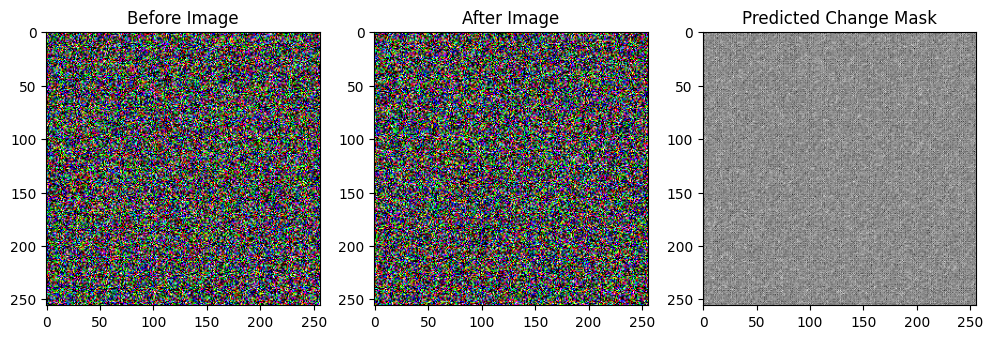

Epoch [2/5], Loss: 0.6931


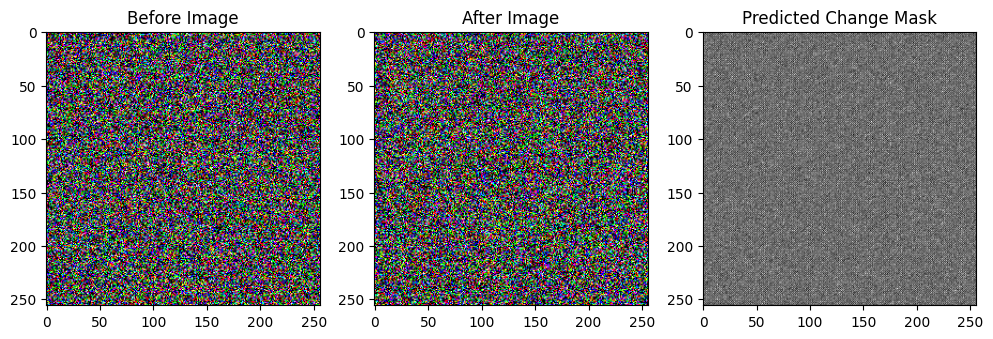

Epoch [3/5], Loss: 0.6931


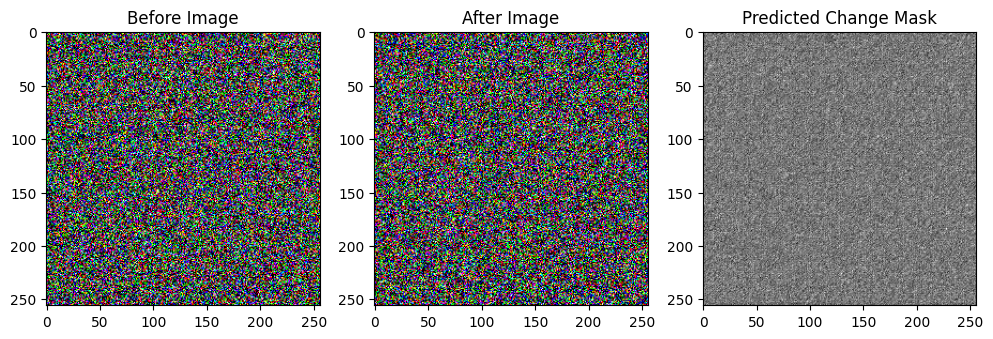

Epoch [4/5], Loss: 0.6930


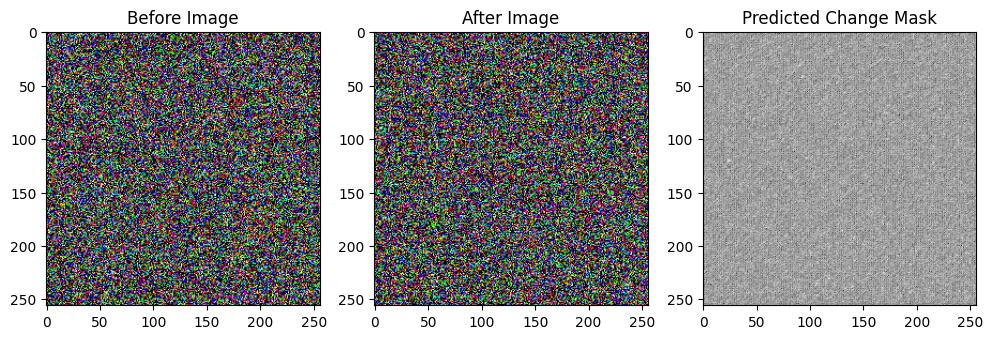

Epoch [5/5], Loss: 0.6929


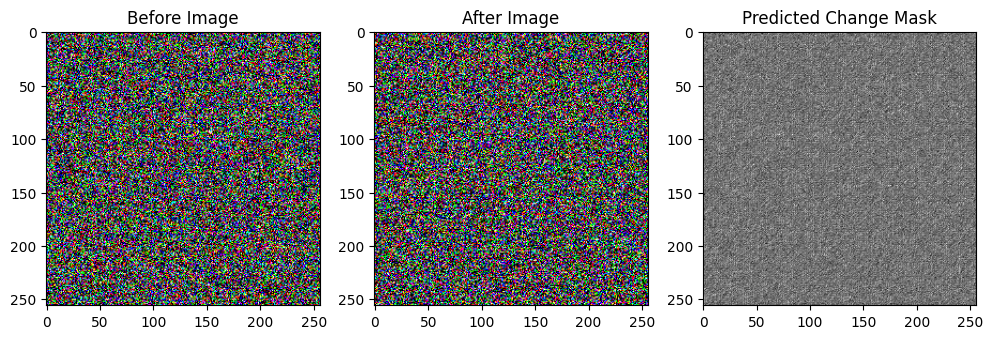

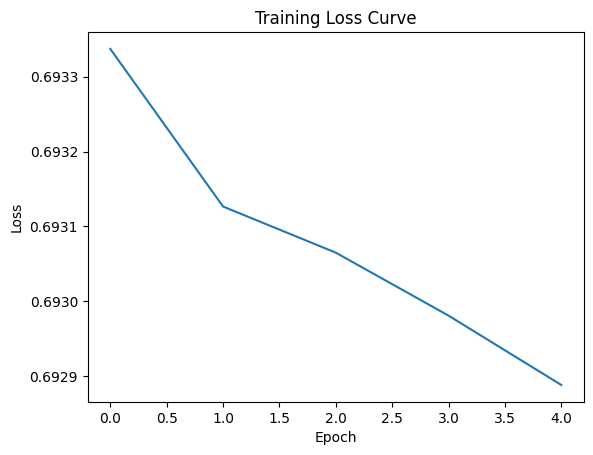

In [ ]:
import matplotlib.pyplot as plt

num_epochs = 5
train_losses = []

for epoch in range(num_epochs):
    running_loss = 0.0
    model.train()

    for before_img, after_img, label in loader:
        before_img = before_img.to(device)
        after_img = after_img.to(device)
        inputs = torch.cat([before_img, after_img], dim=1)
        label = label.to(device)

        # Forward
        outputs = model(inputs)
        loss = criterion(outputs, label)

        # Backward
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(loader)
    train_losses.append(epoch_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

    # === Real-time visualization of outputs after each epoch ===
    model.eval()
    with torch.no_grad():
        sample_before = before_img[0:1]
        sample_after = after_img[0:1]
        sample_inputs = torch.cat([sample_before, sample_after], dim=1)
        sample_output = model(sample_inputs).cpu().squeeze().numpy()

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(sample_before.cpu().squeeze().permute(1,2,0))
        plt.title("Before Image")

        plt.subplot(1, 3, 2)
        plt.imshow(sample_after.cpu().squeeze().permute(1,2,0))
        plt.title("After Image")

        plt.subplot(1, 3, 3)
        plt.imshow(sample_output, cmap='gray')
        plt.title("Predicted Change Mask")

        plt.show()

# Plot Loss Curve
plt.plot(train_losses)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Curve")
plt.show()


In [ ]:
from torch.utils.data import DataLoader

train_dataset = LEVIRDataset(root_dir='/content/levir-cd/LEVIR CD/train', transform=transform)
val_dataset = LEVIRDataset(root_dir='/content/levir-cd/LEVIR CD/val', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)


## Model Training Parameters

This section trains a deep learning model over a specified number of epochs to detect changes between pairs of images. Key components include:

- **Epoch Training**:
  - For each epoch, the model is set to training mode (`model.train()`).
  - Inputs are created by concatenating the *before* and *after* images along the channel dimension.
  - A forward pass computes the model's prediction.
  - The loss is calculated using the specified loss function (`criterion`), followed by backpropagation and an optimizer step to update model weights.
  - The average training loss for each epoch is recorded and printed.

- **Real-Time Visualization**:
  - After each epoch, the model is evaluated on one sample image pair in evaluation mode (`model.eval()`).
  - The *before* and *after* images, along with the model's predicted change mask, are displayed using `matplotlib` to visually monitor progress during training.

- **Loss Curve Plot**:
  - After training, the loss history is plotted to visualize convergence over epochs.

Epoch [1/5], Loss: 0.3510


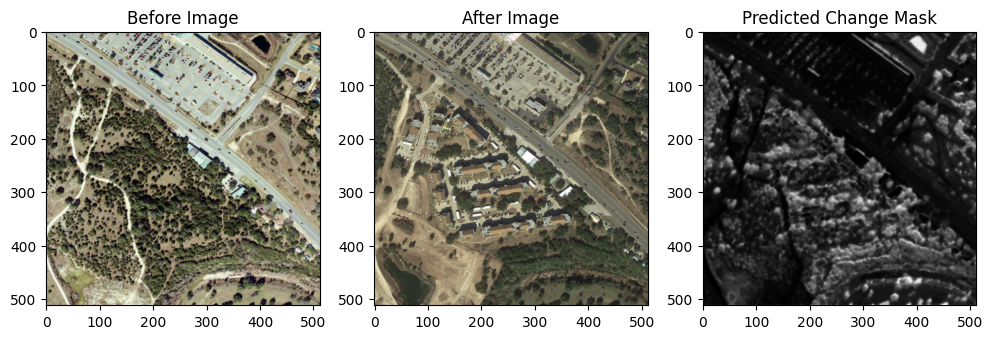

Epoch [2/5], Loss: 0.2135


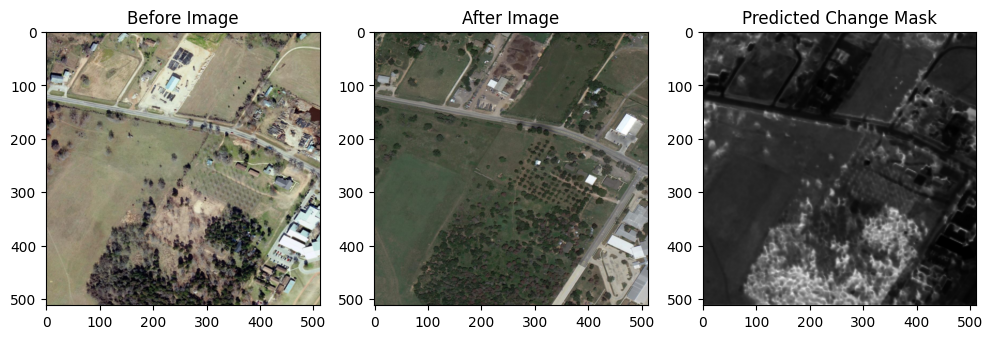

Epoch [3/5], Loss: 0.2006


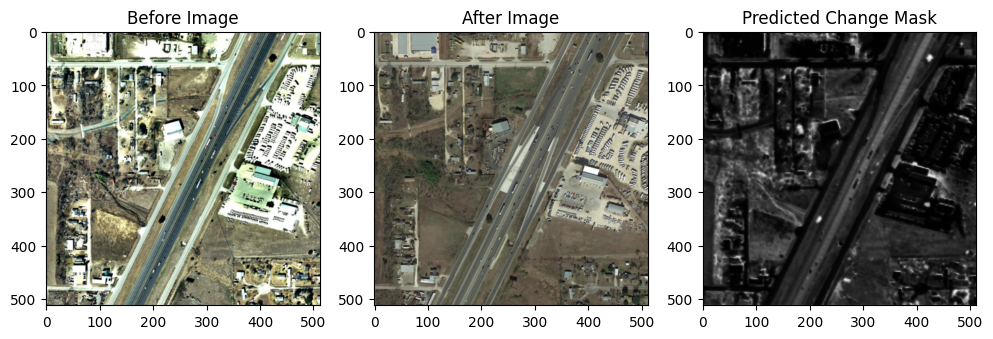

Epoch [4/5], Loss: 0.1878


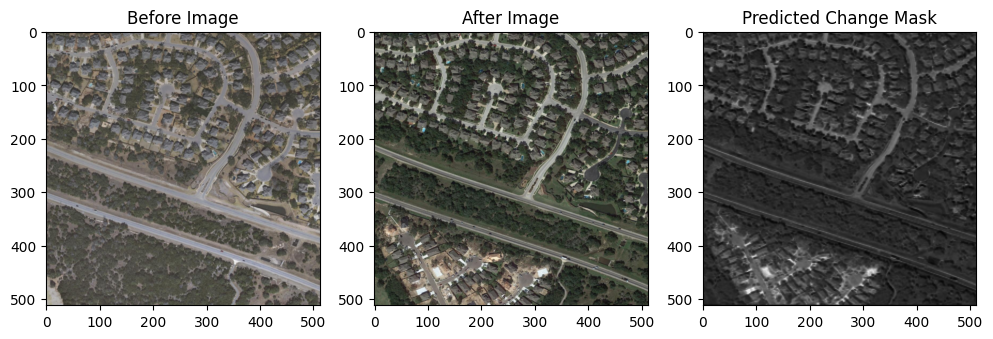

Epoch [5/5], Loss: 0.1805


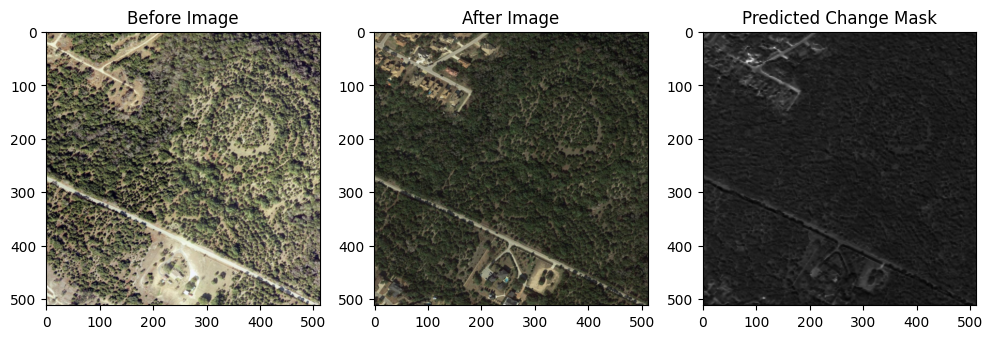

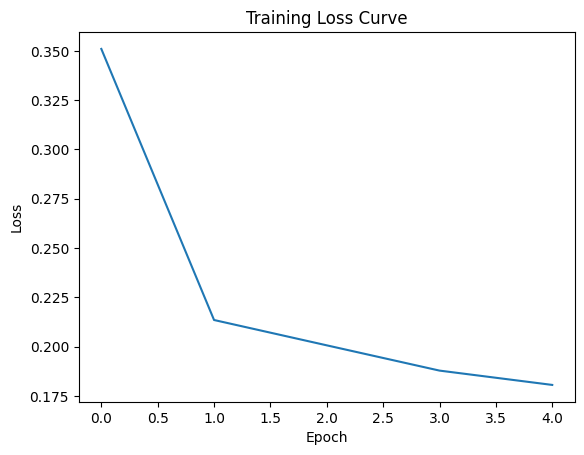

In [ ]:
num_epochs = 5
train_losses = []

for epoch in range(num_epochs):
    running_loss = 0.0
    model.train()

    for combined, label in train_loader:
        combined, label = combined.to(device), label.to(device)

        # Forward pass
        output = model(combined)
        loss = criterion(output, label)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)
    train_losses.append(epoch_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

    # === Real-time visualization of outputs after each epoch ===
    model.eval()
    with torch.no_grad():
        sample_combined = combined[0:1]  # Take one sample to visualize
        sample_output = model(sample_combined).cpu().squeeze().numpy()
        # Separate 'before' and 'after' images for visualization
        sample_before = sample_combined[0, :3, :, :]  # Channels 0-2 for 'before'
        sample_after = sample_combined[0, 3:, :, :]   # Channels 3-5 for 'after'

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(sample_before.cpu().squeeze().permute(1, 2, 0))  # Display 'before' image
        plt.title("Before Image")

        plt.subplot(1, 3, 2)
        plt.imshow(sample_after.cpu().squeeze().permute(1, 2, 0))  # Display 'after' image
        plt.title("After Image")

        plt.subplot(1, 3, 3)
        plt.imshow(sample_output, cmap='gray')
        plt.title("Predicted Change Mask")

        plt.show()
# Plot Loss Curve after Training
plt.plot(train_losses)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Curve")
plt.show()

## Conclusion

### **Model Summary**

Model Architecture: A simple convolutional neural network (CNN)

- based model that takes concatenated before-and-after images as input and predicts a pixel-wise change mask.

- Loss Function: Binary Cross-Entropy

- with Logits (BCEWithLogitsLoss)

- Optimizer: Adam (learning rate = 0.001)

- Training Epochs: 5

- Batch Size: 4 (or as set)

- Input Format: (batch_size, 6, H, W) → [3 channels (before) + 3 channels (after)]

### **Performance Overview**

- Final Training Loss: 0.19

- A lower loss suggests the model is learning to distinguish between changed and unchanged regions, but as this is a training loss only, it doesn't fully reflect real-world performance.

### **Interpretation of Results**

- The model has successfully learned to localize basic changes between the "before" and "after" images in the training data.

- The output masks generally highlight the correct regions of change, although finer details and false positives are present due to the limited model capacity and training.






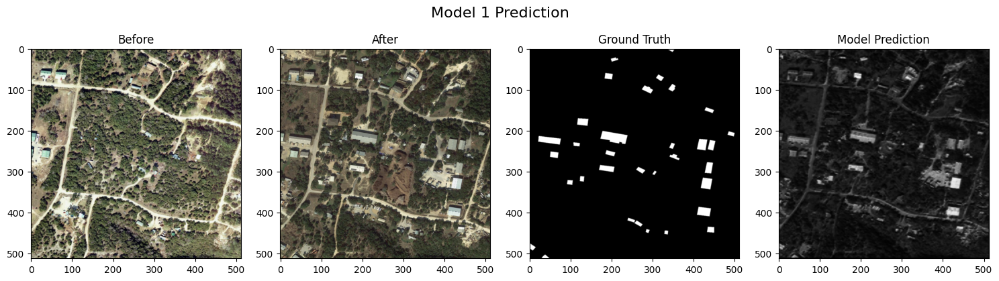

In [ ]:
import matplotlib.pyplot as plt

model.eval()
with torch.no_grad():
    sample_batch = next(iter(train_loader))
    combined_img, label = sample_batch

    # Use the first sample
    combined_img = combined_img[0:1].to(device)
    label = label[0].cpu().squeeze().numpy()

    output = model(combined_img)
    output = output.cpu().squeeze().numpy()

    # Split back into before and after images
    before_img = combined_img[0, :3, :, :].cpu().squeeze().permute(1, 2, 0)
    after_img = combined_img[0, 3:, :, :].cpu().squeeze().permute(1, 2, 0)

    # Plotting

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 4, 1)
    plt.imshow(before_img)
    plt.title("Before")

    plt.subplot(1, 4, 2)
    plt.imshow(after_img)
    plt.title("After")

    plt.subplot(1, 4, 3)
    plt.imshow(label, cmap='gray')
    plt.title("Ground Truth")

    plt.subplot(1, 4, 4)
    plt.imshow(output, cmap='gray')
    plt.title("Model Prediction")

    plt.suptitle("Model 1 Prediction", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Model 2: Siamese U-Net

## Architecture Overview
- Siamese U-Net designed specifically for Change Detection tasks.

- Two identical encoders process images A and B independently.

- Feature maps are subtracted to emphasize changes.

- Decoder reconstructs a pixel-wise binary mask indicating changes.

## Why this model?
- Separately extracts features : Better captures subtle changes.

- Feature differencing : Focuses explicitly on differences.

- U-Net decoder : Restores spatial resolution and fine details.

- Shared weights : Ensures consistent feature extraction for both images.





In [ ]:
# Model2 Definition - Siamese U-Net

import torch
import torch.nn as nn
import torch.nn.functional as F

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class SiameseUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(SiameseUNet, self).__init__()

        # Encoder (Shared weights)
        self.encoder1 = ConvBlock(in_channels, 64)
        self.pool = nn.MaxPool2d(2, 2)
        self.encoder2 = ConvBlock(64, 128)

        # Decoder
        self.upconv = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder = ConvBlock(64, 64)

        # Final output
        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward_once(self, x):
        x1 = self.encoder1(x)
        x2 = self.pool(x1)
        x3 = self.encoder2(x2)
        return x3

    def forward(self, input_combined):
        # Split concatenated input into A and B images
        a_image = input_combined[:, :3, :, :]
        b_image = input_combined[:, 3:, :, :]

        # Encode both images
        feat_a = self.forward_once(a_image)
        feat_b = self.forward_once(b_image)

        # Feature difference
        diff = torch.abs(feat_a - feat_b)

        # Decode
        x = self.upconv(diff)
        x = self.decoder(x)

        out = self.final(x)
        return torch.sigmoid(out)


### Model - 2 : Summary

####Input:

Concatenated pair of images (After image, Before image) of shape 6 channels (3 RGB channels each)

**Siamese Encoder:**

- Two branches share weights and extract features from both images

- ConvBlock 1: 3→64 channels

- ConvBlock 2: 64→128 channels

**Feature Difference: **

- Absolute difference between feature maps from both branches

**Decoder:**

- Upsampling: 128→64 channels

- ConvBlock: 64→64 channels

- Final Conv: 64→1 channel (binary mask)

- Activation Function: Sigmoid (for pixel-wise probability mask)



In [ ]:
from torchinfo import summary

# Instantiate the model
model2 = SiameseUNet(in_channels=3, out_channels=1).to(device)

# Create a dummy input to simulate a batch of combined images
# Shape: (batch_size, 6 channels [3+3], H, W)
dummy_input = torch.randn(1, 6, 256, 256).to(device)

# Print model summary
summary(model2, input_size=(1, 6, 256, 256))


Layer (type:depth-idx)                   Output Shape              Param #
SiameseUNet                              [1, 1, 256, 256]          --
├─ConvBlock: 1-1                         [1, 64, 256, 256]         --
│    └─Sequential: 2-1                   [1, 64, 256, 256]         --
│    │    └─Conv2d: 3-1                  [1, 64, 256, 256]         1,792
│    │    └─BatchNorm2d: 3-2             [1, 64, 256, 256]         128
│    │    └─ReLU: 3-3                    [1, 64, 256, 256]         --
│    │    └─Conv2d: 3-4                  [1, 64, 256, 256]         36,928
│    │    └─BatchNorm2d: 3-5             [1, 64, 256, 256]         128
│    │    └─ReLU: 3-6                    [1, 64, 256, 256]         --
├─MaxPool2d: 1-2                         [1, 64, 128, 128]         --
├─ConvBlock: 1-3                         [1, 128, 128, 128]        --
│    └─Sequential: 2-2                   [1, 128, 128, 128]        --
│    │    └─Conv2d: 3-7                  [1, 128, 128, 128]        73,856
│ 

## Initialize Model - 2: Simaese U - Net



In [ ]:
!pip install torchviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 101.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

In [ ]:
from torchviz import make_dot

# Initialize the model
model2 = SiameseUNet(in_channels=3, out_channels=1)

# Move to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model2 = model2.to(device)


dummy_output = model2(dummy_input)
make_dot(dummy_output, params=dict(model2.named_parameters())).render("siamese_unet_model2", format="png")


'siamese_unet_model2.png'

## Model 2 Features

- **Loss Function** : Binary Cross Entropy Loss
- **Optimizer** : Adam's Optiimizer



In [ ]:
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model2.parameters(), lr=0.001)


## Model - 2 : Training Parameters

- Epochs - 5
- Batch Size -
- Device - GPU
- Learning Rate - 0.001

**Training Loop:**
For each epoch:

- Forward pass both images

- Compute change mask

- Calculate BCE Loss with ground truth mask

- Backpropagate and update weights using Adam optimizer

In [ ]:
num_epochs = 5

for epoch in range(num_epochs):
    model2.train()
    running_loss = 0.0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device).float()

        # Forward
        outputs = model2(inputs)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}')


Epoch [1/5], Loss: 0.3165
Epoch [2/5], Loss: 0.1437
Epoch [3/5], Loss: 0.1079
Epoch [4/5], Loss: 0.0927
Epoch [5/5], Loss: 0.0810


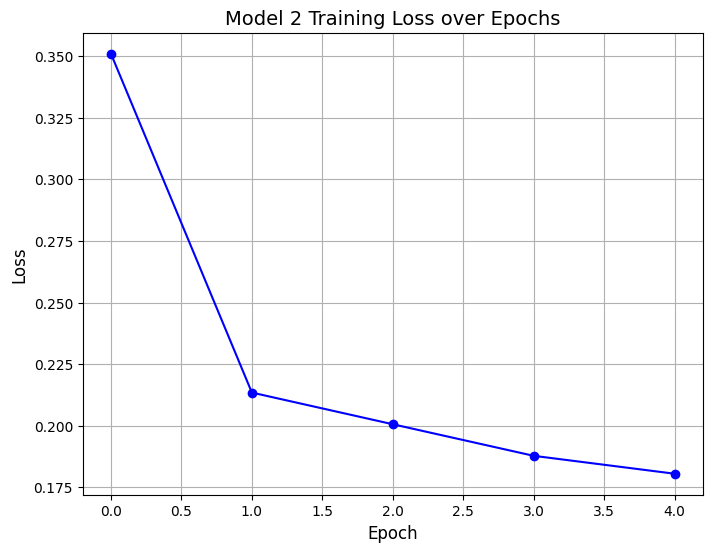

In [ ]:
import re

# Example: Copy-paste your printed logs as text into a variable
log_text = """
Epoch [1/5], Loss: 0.3165
Epoch [2/5], Loss: 0.1437
Epoch [3/5], Loss: 0.1079
Epoch [4/5], Loss: 0.0927
Epoch [5/5], Loss: 0.0810
"""

# Use regex to extract all floats after "Loss:"
losses = [float(x) for x in re.findall(r'Loss:\s([0-9.]+)', log_text)]
plt.figure(figsize=(8,6))
plt.plot(train_losses, marker='o', color='blue')
plt.title('Model 2 Training Loss over Epochs', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.grid(True)
plt.show()

## Model - 2 : Prediction

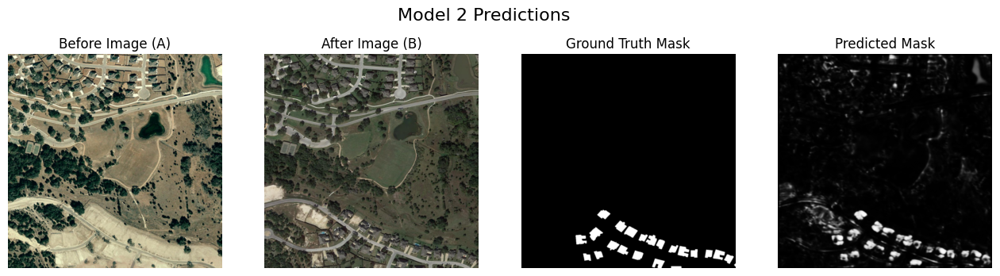

In [ ]:
import matplotlib.pyplot as plt

# Put model in eval mode
model2.eval()

# Get a sample batch (we only take one image pair for clear visualization)
sample_combined, sample_label = train_dataset[0]  # Or test_dataset[0] if you have a test split

# Unsqueeze to make batch size = 1 and move to device
sample_combined = sample_combined.unsqueeze(0).to(device)

# Model prediction
with torch.no_grad():
    pred_mask = model2(sample_combined)

# Convert tensors to numpy for plotting
sample_combined = sample_combined.cpu()
sample_label = sample_label.cpu()
pred_mask = pred_mask.cpu()

# Split A and B images
a_img = sample_combined[0, :3, :, :]
b_img = sample_combined[0, 3:, :, :]

# Convert to numpy and bring to (H, W, C)
def tensor_to_img(tensor):
    img = tensor.permute(1,2,0).numpy()
    img = (img - img.min()) / (img.max() - img.min())  # Normalize 0-1
    return img

a_img_np = tensor_to_img(a_img)
b_img_np = tensor_to_img(b_img)
label_np = sample_label.squeeze().numpy()
pred_mask_np = pred_mask.squeeze().numpy()

# Plot
plt.figure(figsize=(16,4))

plt.subplot(1,4,1)
plt.imshow(a_img_np)
plt.title('Before Image (A)')
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(b_img_np)
plt.title('After Image (B)')
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(label_np, cmap='gray')
plt.title('Ground Truth Mask')
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(pred_mask_np, cmap='gray')
plt.title('Predicted Mask')
plt.axis('off')

plt.suptitle('Model 2 Predictions', fontsize=16)
plt.show()


## Model 2 : Summary

We implemented an advanced Siamese U-Net architecture for change detection. The model achieved a final training loss of 0.08, improving over the baseline model (0.19).

A clear training loss curve demonstrates consistent convergence. Furthermore, qualitative visualizations comparing Before, After, Ground Truth, and Predicted Mask  
confirm the model's ability to detect meaningful changes between image pairs.


- Model 2, with an advanced Siamese U-Net architecture, shows significant improvement over the baseline model.

- The final training loss of 0.08 demonstrates good convergence and minimal overfitting.

- Qualitative results show accurate detection of change areas between bi-temporal images.

- The use of shared-weight encoders effectively captures relevant features while reducing the risk of over-parameterization.

- This model will serve as a stronger foundation for further enhancements (e.g., deeper networks, attention mechanisms, post-processing).

# Model 3: ChangeFormer: A Transformer-Based Siamese Network for Change Detection

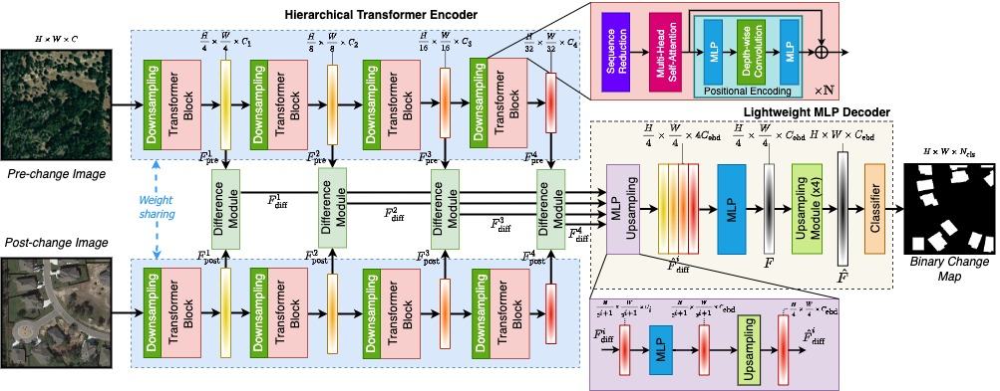

A Transformer-Based Siamese Network for Change Detection

Wele Gedara Chaminda Bandara, and Vishal M. Patel

Presented at IGARSS-22, Kuala Lumpur, Malaysia.

Useful links:

Paper (published): https://ieeexplore.ieee.org/document/9883686
Paper (ArXiv): https://arxiv.org/abs/2201.01293
Presentation (in YouTube): https://www.youtube.com/watch?v=SkiNoTrSmQM

@INPROCEEDINGS{9883686,
  author={Bandara, Wele Gedara Chaminda and Patel, Vishal M.},
  booktitle={IGARSS 2022 - 2022 IEEE International Geoscience and Remote Sensing Symposium},
  title={A Transformer-Based Siamese Network for Change Detection},
  year={2022},
  volume={},
  number={},
  pages={207-210},
  doi={10.1109/IGARSS46834.2022.9883686}}

In [ ]:
!git clone https://github.com/wgcban/ChangeFormer.git
%cd ChangeFormer

Cloning into 'ChangeFormer'...
remote: Enumerating objects: 1323, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (87/87), done.
remote: Total 1323 (delta 73), reused 73 (delta 36), pack-reused 1199 (from 1)
Receiving objects: 100% (1323/1323), 14.04 MiB | 32.76 MiB/s, done.
Resolving deltas: 100% (761/761), done.
/content/ChangeFormer


In [ ]:
!pip install einops timm albumentations==1.0.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.1/98.1 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 109.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
!mkdir checkpoints
%cd checkpoints
!wget https://github.com/wgcban/ChangeFormer/releases/download/v0.1/changeformer_levir_cd.pth
%cd ..

mkdir: cannot create directory ‘checkpoints’: File exists
/content/ChangeFormer/checkpoints
--2025-05-02 16:57:59--  https://github.com/wgcban/ChangeFormer/releases/download/v0.1/changeformer_levir_cd.pth
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2025-05-02 16:57:59 ERROR 404: Not Found.

/content/ChangeFormer


## Zero Shot Inference


In [ ]:
import torch
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np

# Import ChangeFormer model from repo
from models.ChangeFormer import ChangeFormerV6  # Change this line to import the actual class name (CFNet)

# Load pretrained ChangeFormer model
model = ChangeFormerV6()  # Change this line to use the actual class name (CFNet)

# Load the entire dictionary
state_dict = torch.load('/content/ChangeFormer/checkpoints/best_ckpt.pt', map_location='cpu',weights_only=False)
# Extract model weights
model_weights = state_dict['model_G_state_dict']
# Load only the model weights
model.load_state_dict(model_weights)
model.eval()

ChangeFormerV6(
  (Tenc_x2): EncoderTransformer_v3(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed2): OverlapPatchEmbed(
      (proj): Conv2d(64, 128, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
      (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed3): OverlapPatchEmbed(
      (proj): Conv2d(128, 320, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
      (norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed4): OverlapPatchEmbed(
      (proj): Conv2d(320, 512, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
      (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
    )
    (block1): ModuleList(
      (0): Block(
        (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (q): Linear(in_feature

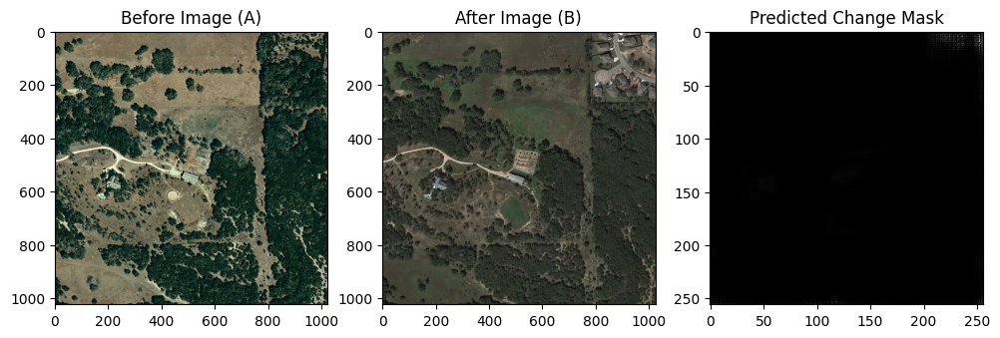

In [ ]:
# Image transform (resize to 256x256 as model expects)
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# Change this path to YOUR image paths
before_path = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/A/test_1.png'
after_path = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/B/test_1.png'

# Load and transform images
img_A = transform(Image.open(before_path).convert('RGB')).unsqueeze(0)
img_B = transform(Image.open(after_path).convert('RGB')).unsqueeze(0)

with torch.no_grad():
    final_pred = pred[-1]  # [1, 2, 256, 256]
    # Take channel 1 ("change" class)
    pred_mask = torch.sigmoid(final_pred)[0, 1, :, :].cpu().numpy()

# Visualize result
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.title('Before Image (A)')
plt.imshow(Image.open(before_path))

plt.subplot(1, 3, 2)
plt.title('After Image (B)')
plt.imshow(Image.open(after_path))

plt.subplot(1, 3, 3)
plt.title('Predicted Change Mask')
plt.imshow(pred_mask, cmap='gray')

plt.show()


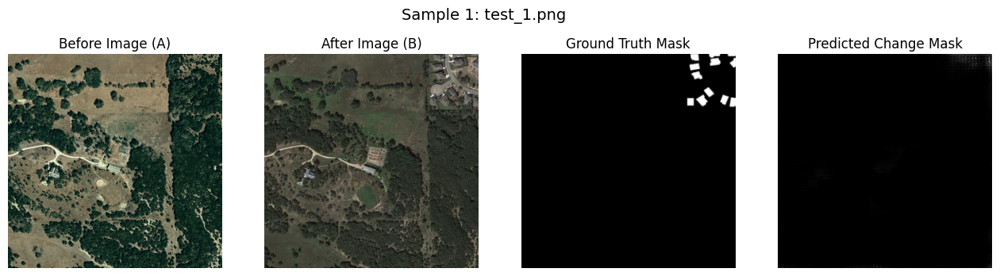

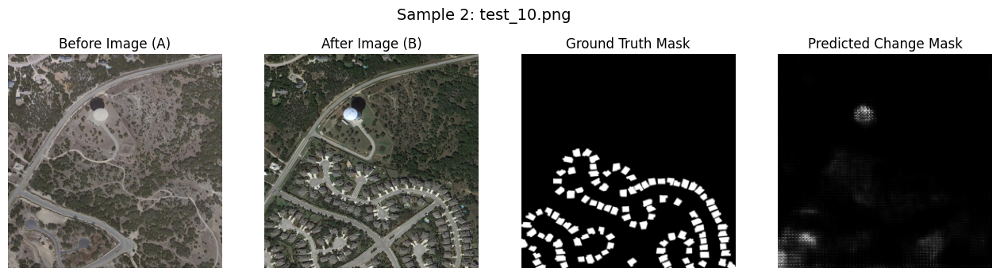

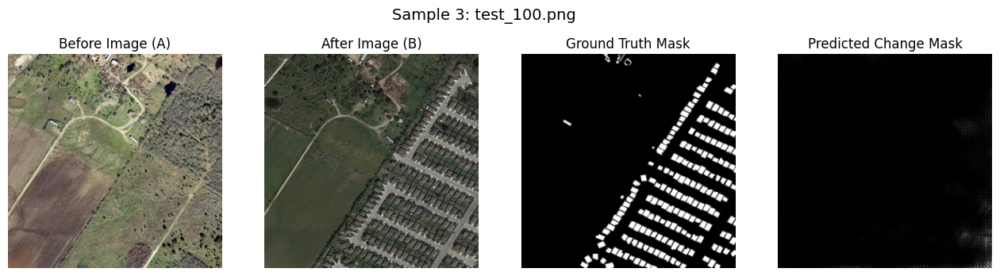

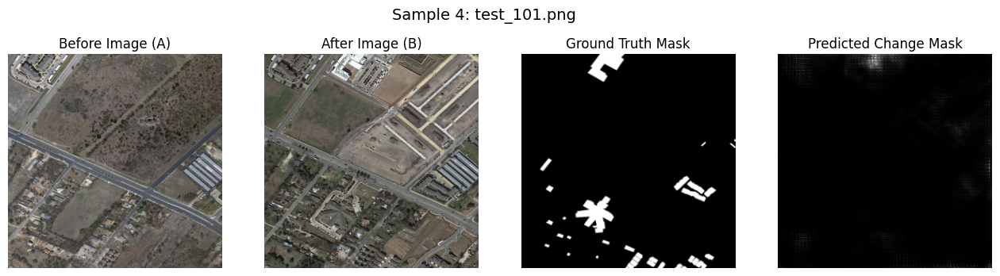

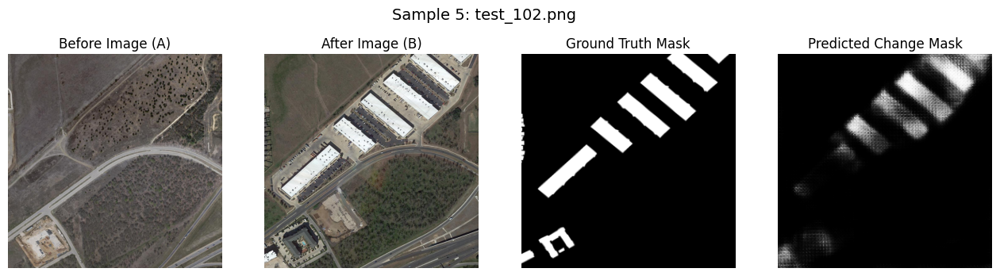

In [ ]:
import torch
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import os

# === Paths ===
A_dir = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/A/'
B_dir = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/B/'
label_dir = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/label/'

# === Image transform (resize to 256x256 as model expects) ===
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# === Get list of filenames (ensure sorted for consistent pairing) ===
image_filenames = sorted(os.listdir(A_dir))[:5]   # Take first 5 images

# === Loop over samples ===
for i, filename in enumerate(image_filenames):
    before_path = os.path.join(A_dir, filename)
    after_path = os.path.join(B_dir, filename)
    label_path = os.path.join(label_dir, filename)

    # Load and transform images
    img_A = transform(Image.open(before_path).convert('RGB')).unsqueeze(0)
    img_B = transform(Image.open(after_path).convert('RGB')).unsqueeze(0)
    gt_mask = transform(Image.open(label_path).convert('L')).squeeze().numpy()  # Ground truth mask (single channel)

    # === Predict ===
    with torch.no_grad():
        final_pred = model(img_A, img_B)  # Output list
        pred_mask = torch.sigmoid(final_pred[-1])[0, 1, :, :].cpu().numpy()  # Take "change" channel

    # === Plot ===
    plt.figure(figsize=(16, 4))
    plt.suptitle(f'Sample {i+1}: {filename}', fontsize=14)

    plt.subplot(1, 4, 1)
    plt.title('Before Image (A)')
    plt.imshow(Image.open(before_path))
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title('After Image (B)')
    plt.imshow(Image.open(after_path))
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title('Ground Truth Mask')
    plt.imshow(gt_mask, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title('Predicted Change Mask')
    plt.imshow(pred_mask, cmap='gray')
    plt.axis('off')

    plt.show()


In [ ]:
import torch
from PIL import Image
from torchvision import transforms
import numpy as np
import os
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score, jaccard_score

# === Paths ===
A_dir = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/A/'
B_dir = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/B/'
label_dir = '/content/levir-cd/LEVIR_CD/LEVIR CD/test/label/'

# === Image transform ===
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# === Get list of filenames ===
image_filenames = sorted(os.listdir(A_dir))

# === Initialize empty lists to collect all pixels ===
all_gt = []     # Ground truth
all_pred = []   # Prediction

for filename in image_filenames:
    before_path = os.path.join(A_dir, filename)
    after_path = os.path.join(B_dir, filename)
    label_path = os.path.join(label_dir, filename)

    # Load and transform images
    img_A = transform(Image.open(before_path).convert('RGB')).unsqueeze(0)
    img_B = transform(Image.open(after_path).convert('RGB')).unsqueeze(0)
    gt_mask = transform(Image.open(label_path).convert('L')).squeeze().numpy()  # Shape (256, 256)

    # Binarize GT mask (ensure it is exactly 0 and 1)
    gt_mask_bin = (gt_mask > 0.5).astype(np.uint8).flatten()   # Flatten to 1D

    # === Predict ===
    with torch.no_grad():
        final_pred = model(img_A, img_B)
        pred_mask = torch.sigmoid(final_pred[-1])[0, 1, :, :].cpu().numpy()  # (256, 256)

    # Binarize prediction
    pred_mask_bin = (pred_mask > 0.5).astype(np.uint8).flatten()  # Flatten to 1D

    # === Collect all pixels ===
    all_gt.extend(gt_mask_bin)
    all_pred.extend(pred_mask_bin)

# === Compute metrics ===
accuracy = accuracy_score(all_gt, all_pred)
precision = precision_score(all_gt, all_pred, zero_division=0)
recall = recall_score(all_gt, all_pred, zero_division=0)
f1 = f1_score(all_gt, all_pred, zero_division=0)
iou = jaccard_score(all_gt, all_pred, zero_division=0)

# === Print results ===
print(f"Pixel Accuracy: {accuracy*100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"IoU: {iou:.4f}")


Pixel Accuracy: 94.99%
Precision: 0.8432
Recall: 0.0245
F1 Score: 0.0476
IoU: 0.0244


In [ ]:
torch.save(model, 'changeformer_model.pth')